In [1]:
import scanpy as sc
import seaborn as sns
import numpy as np
import scvi
import os
import pandas as pd
import matplotlib.pyplot as plt
import scipy
directory = '/Users/david/Dropbox/RNASeq/AllenPAL'

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


## preprocessing, SCVI ##

In [2]:
#load VP neurons
adatavp = sc.read_h5ad('/Users/david/Dropbox/RNASeq/HFD/neurons.h5ad')

In [3]:
#load NAc neurons
adatanac = sc.read_h5ad('/Users/david/Dropbox/RNASeq/Chen2021/neurons.h5ad')

In [4]:
#load pallidum neurons from ABC atlas
adatapal = sc.read_h5ad('/Users/david/Dropbox/RNASeq/AllenPAL/neurons.h5ad')

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [5]:
#load rat neurons
adatarat = sc.read_h5ad('/Users/david/Dropbox/RNASeq/Rat/neurons.h5ad')

In [6]:
#make gene names unique in Allen dataset
gs = adatapal.var.gene_symbol.tolist()
(palgenes,counts) = np.unique(gs, return_counts=True)
repeats = palgenes[counts==2]
for r in range(0,len(repeats)):
    gene = repeats[r]
    copy = np.nonzero(np.isin(gs,gene))[0][1]
    gs[copy] = gs[copy] + '-1'
adatapal.var.index=gs

In [7]:
#get metadata for allen dataset
allMeta = pd.read_csv('/Users/david/Dropbox/RNASeq/AllenPAL/Data/cell_metadata_with_cluster_annotation.csv')

/var/folders/0d/m1rp2vsn40550y2btkrfwptr0000gn/T/ipykernel_69905/166713103.py:2: DtypeWarning: Columns (16) have mixed types. Specify dtype option on import or set low_memory=False.
  allMeta = pd.read_csv('/Users/david/Dropbox/RNASeq/AllenPAL/Data/cell_metadata_with_cluster_annotation.csv')


In [8]:
#only keep data for PAL cells in meta file
palMeta = allMeta[allMeta.cell_label.isin(adatapal.obs.index)]
adatapal = adatapal[adatapal.obs.index.isin(palMeta.cell_label)]

In [9]:
#sort data the same way
palMeta = palMeta.sort_values(by=['cell_label'])
order = np.argsort(adatapal.obs.index)
adatapal=adatapal[order]

In [10]:
adatapal.obs['cluster']=palMeta['cluster'].to_numpy()
adatapal.obs['class']=palMeta['class'].to_numpy()
adatapal.obs['subclass']=palMeta['subclass'].to_numpy()
adatapal.obs['supertype']=palMeta['supertype'].to_numpy()
adatapal.obs['neurotransmitter']=palMeta['neurotransmitter'].to_numpy()
adatapal.obs['Experiment']='PAL'
adatapal.obs['Species']='Mouse'

/var/folders/0d/m1rp2vsn40550y2btkrfwptr0000gn/T/ipykernel_69905/1596155659.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adatapal.obs['cluster']=palMeta['cluster'].to_numpy()


In [11]:
adatanac.obs['Experiment']='NAC'
adatanac.obs['cluster']='None'
adatanac.obs['class']='None'
adatanac.obs['subclass']='None'
adatanac.obs['supertype']='None'
adatanac.obs['neurotransmitter']='None'
adatanac.obs['Species']='Mouse'

In [12]:
adatavp.obs['Experiment']='VP'
adatavp.obs['cluster']='None'
adatavp.obs['class']='None'
adatavp.obs['subclass']='None'
adatavp.obs['supertype']='None'
adatavp.obs['neurotransmitter']='None'
adatavp.obs['Species']='Mouse'

In [13]:
adatarat.obs['Experiment']='Rat'
adatarat.obs['cluster']='None'
adatarat.obs['class']='None'
adatarat.obs['subclass']='None'
adatarat.obs['supertype']='None'
adatarat.obs['neurotransmitter']='None'
adatarat.obs['Species']='Rat'

In [14]:
adata = sc.concat([adatanac,adatavp,adatapal,adatarat])

In [16]:
adata.obs['neurotransmitter'][adata.obs['neurotransmitter']!=adata.obs['neurotransmitter']]='None'

/var/folders/0d/m1rp2vsn40550y2btkrfwptr0000gn/T/ipykernel_69905/1515138688.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['neurotransmitter'][adata.obs['neurotransmitter']!=adata.obs['neurotransmitter']]='None'


In [17]:
adata.write_h5ad(directory + '/NAcVPInt.h5ad')

In [18]:
del(adatavp,adatanac,adatapal,allMeta,palMeta)

In [19]:
adata_scvi = sc.read_h5ad(directory + '/NAcVPInt.h5ad')

In [20]:
sc.pp.highly_variable_genes(adata_scvi, n_top_genes = 2000, subset = True, layer='counts', flavor = 'seurat_v3', batch_key='Sample')

In [21]:
adata.obs['total_counts']=np.sum(adata.layers['counts'],axis=1)
adata_scvi.obs['total_counts']=np.sum(adata.layers['counts'],axis=1)

In [22]:
scvi.model.SCVI.setup_anndata(adata_scvi, layer = 'counts',
                             batch_key='Sample',
                             continuous_covariate_keys=['total_counts'],
                             categorical_covariate_keys=['Experiment','Species'])
model = scvi.model.SCVI(adata_scvi, n_layers=2, n_latent=30, gene_likelihood="nb")

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


In [24]:
model.train() #may take a while without GPU

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 1/67:   0%|                                                                                | 0/67 [00:00<?, ?it/s]

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Epoch 67/67: 100%|██████████| 67/67 [13:51<00:00, 12.36s/it, v_num=1, train_loss_step=1.39e+3, train_loss_epoch=1.33e+3]

`Trainer.fit` stopped: `max_epochs=67` reached.


Epoch 67/67: 100%|██████████| 67/67 [13:51<00:00, 12.41s/it, v_num=1, train_loss_step=1.39e+3, train_loss_epoch=1.33e+3]


In [25]:
adata.obsm['X_scVI'] = model.get_latent_representation()

In [26]:
sc.pp.neighbors(adata, use_rep = 'X_scVI', method = 'umap', n_neighbors=15)

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


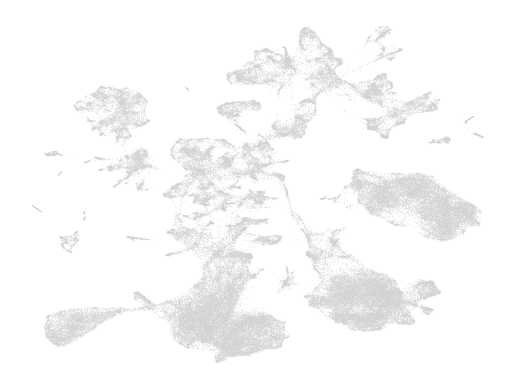

In [27]:
sc.tl.umap(adata, min_dist=0.3)
sc.pl.umap(adata, frameon = False)

In [28]:
adata.write_h5ad(directory + '/NAcVPInt.h5ad')

## assign Allen labels to other datasets ##

In [2]:
adata = sc.read_h5ad(directory + '/NAcVPInt.h5ad')

In [3]:
adata.shape

(119393, 11611)

In [204]:
plt.rcParams['figure.dpi'] = 300

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


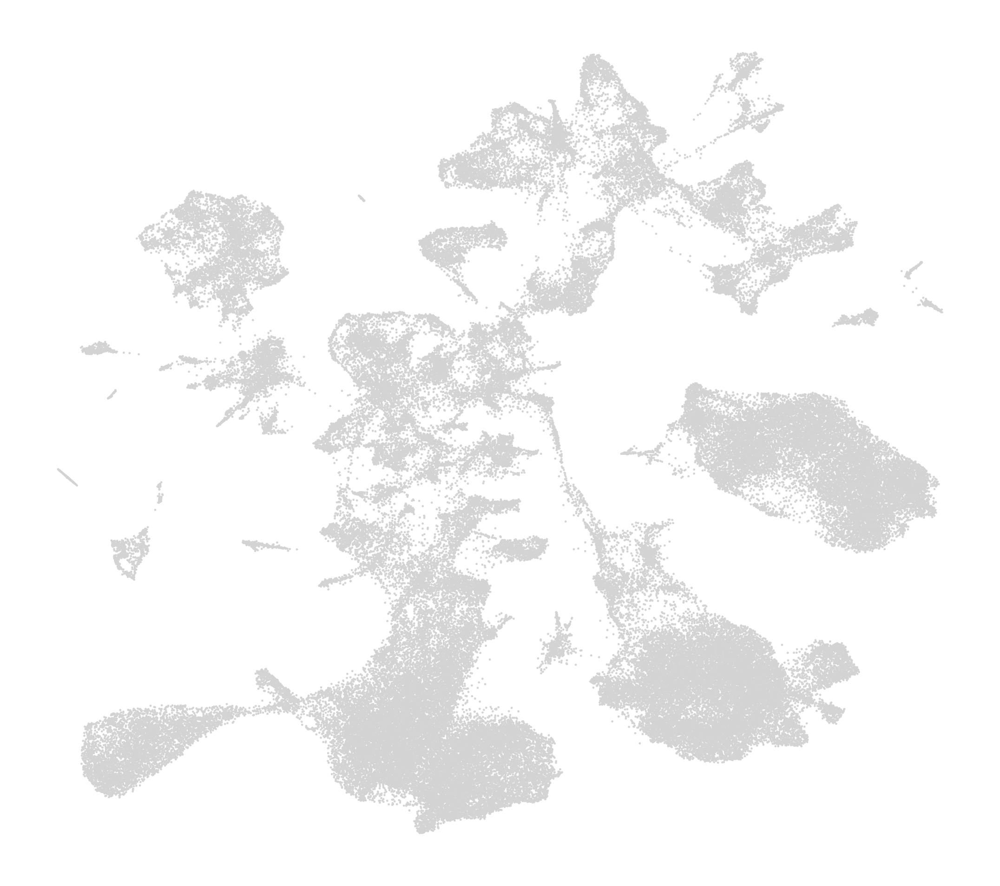

In [232]:
plt.figure(figsize=(9,8))
ax=plt.subplot(1,1,1)
sc.pl.umap(adata, size = 5, frameon = False, legend_loc='None', ax=ax, show=True)

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


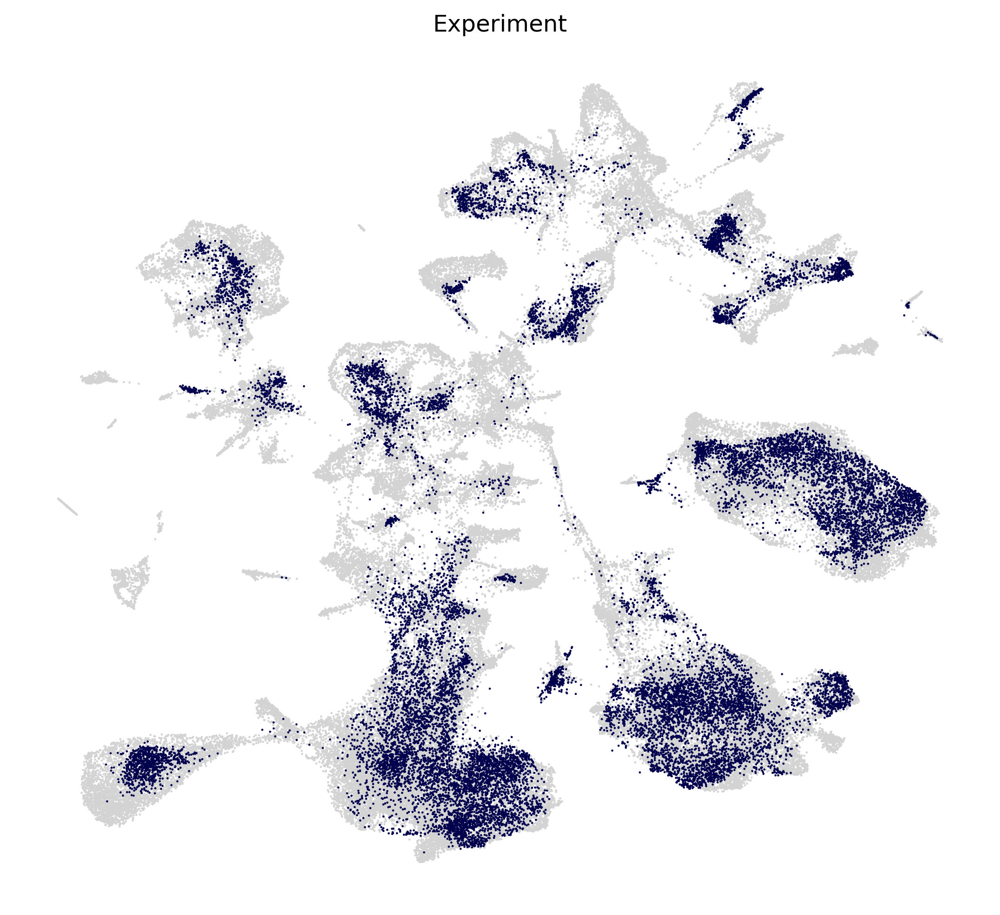

In [202]:
plt.figure(figsize=(9,8))
ax=plt.subplot(1,1,1)
excolors = {'NAC':(0.3, 0.95, 0.94,1),'PAL':(0.8,0.8,0.8,1),'VP':(0.51, 0.2, 1, 1),'Rat':(0, 0, 0.3)}
sc.pl.umap(adata, color = ['Experiment'], groups = ['Rat'], size = 5, frameon = False, palette=excolors, legend_loc='None', ax=ax, show=False)
plt.savefig(directory + '/Figures/neuronsSpecies.png')

In [6]:
#get color palettes
allMeta = pd.read_csv('/Users/david/Dropbox/RNASeq/AllenPAL/Data/cell_metadata_with_cluster_annotation.csv')

(classes,ci) = np.unique(allMeta['class'].to_numpy(),return_index=True)
cc = allMeta['class_color'].to_numpy()[ci]
classp = dict(zip(classes,cc))
classp['None']=(0.8,0.8,0.8,0.2)

(subclasses,si) = np.unique(allMeta['subclass'].to_numpy(),return_index=True)
scc = allMeta['subclass_color'].to_numpy()[si]
subclassp = dict(zip(subclasses,scc))
subclassp['None']=(0.8,0.8,0.8,0.2)

ntlist=allMeta['neurotransmitter'][allMeta['neurotransmitter']==allMeta['neurotransmitter']].to_numpy()
ntclist=allMeta['neurotransmitter_color'][allMeta['neurotransmitter']==allMeta['neurotransmitter']].to_numpy()
(neurotransmitters,ni) = np.unique(ntlist,return_index=True)
nc = ntclist[ni]
neurotransmitterp = dict(zip(neurotransmitters,nc))
neurotransmitterp['None']=(0.8,0.8,0.8,0.2)

del(allMeta)

/var/folders/0d/m1rp2vsn40550y2btkrfwptr0000gn/T/ipykernel_88463/3778227727.py:2: DtypeWarning: Columns (16) have mixed types. Specify dtype option on import or set low_memory=False.
  allMeta = pd.read_csv('/Users/david/Dropbox/RNASeq/AllenPAL/Data/cell_metadata_with_cluster_annotation.csv')


In [205]:
#reset Allen classification for the other datasets
adata.obs['cluster'][adata.obs['Experiment'].isin(['VP','NAC','Rat'])]='None'
adata.obs['class'][adata.obs['Experiment'].isin(['VP','NAC','Rat'])]='None'
adata.obs['subclass'][adata.obs['Experiment'].isin(['VP','NAC','Rat'])]='None'
adata.obs['supertype'][adata.obs['Experiment'].isin(['VP','NAC','Rat'])]='None'
adata.obs['neurotransmitter'][adata.obs['Experiment'].isin(['VP','NAC','Rat'])]='None'
adata.obs['neurotransmitter'][adata.obs['neurotransmitter']!=adata.obs['neurotransmitter']]='None'

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


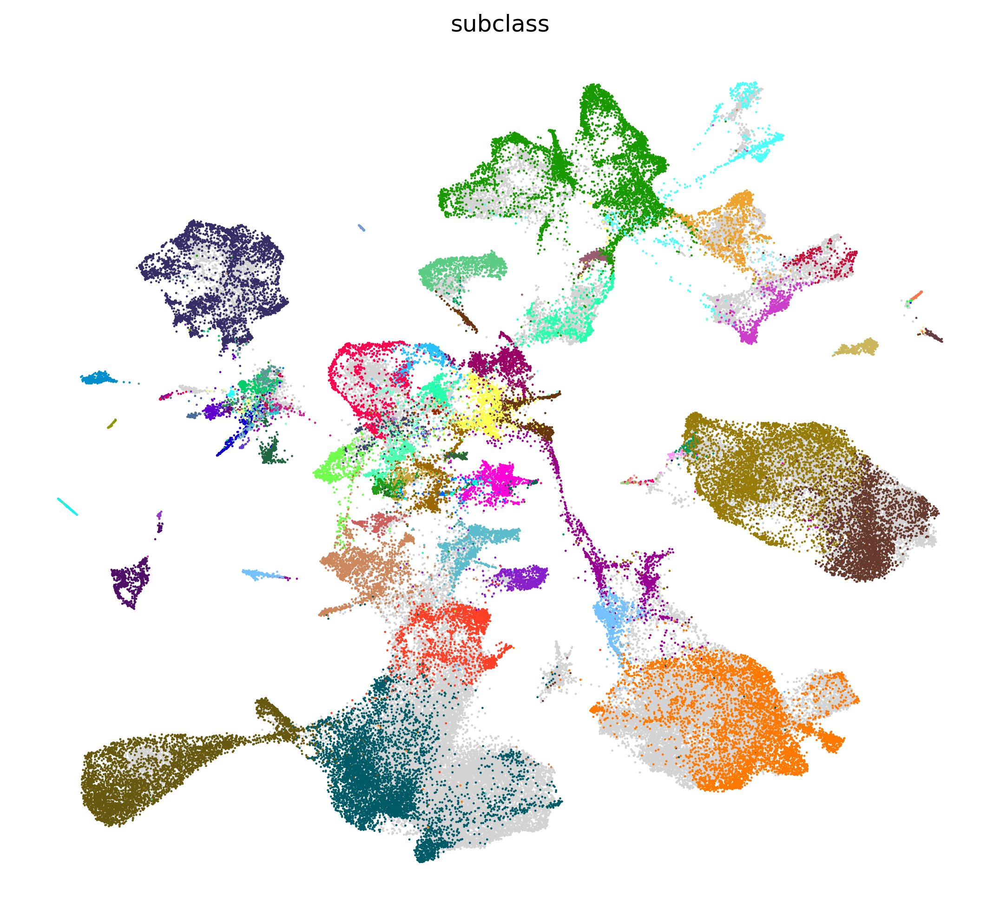

In [206]:
subclasses = np.unique(adata.obs['subclass'])
groups = subclasses[subclasses!='None']

plt.figure(figsize=(9,8))
ax=plt.subplot(1,1,1)
#sc.pl.umap(adata, color = ['Experiment'], size = 4, frameon = False, palette=excolors)
sc.pl.umap(adata, color = ['subclass'], groups = groups.tolist(), size = 5, frameon = False, palette=subclassp, legend_loc='None', ax=ax, show=False)
plt.savefig(directory + '/Figures/allenSubclass.png')

In [26]:
#cluster the neurons for more granular analysis
sc.tl.leiden(adata, resolution = 0.2)

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


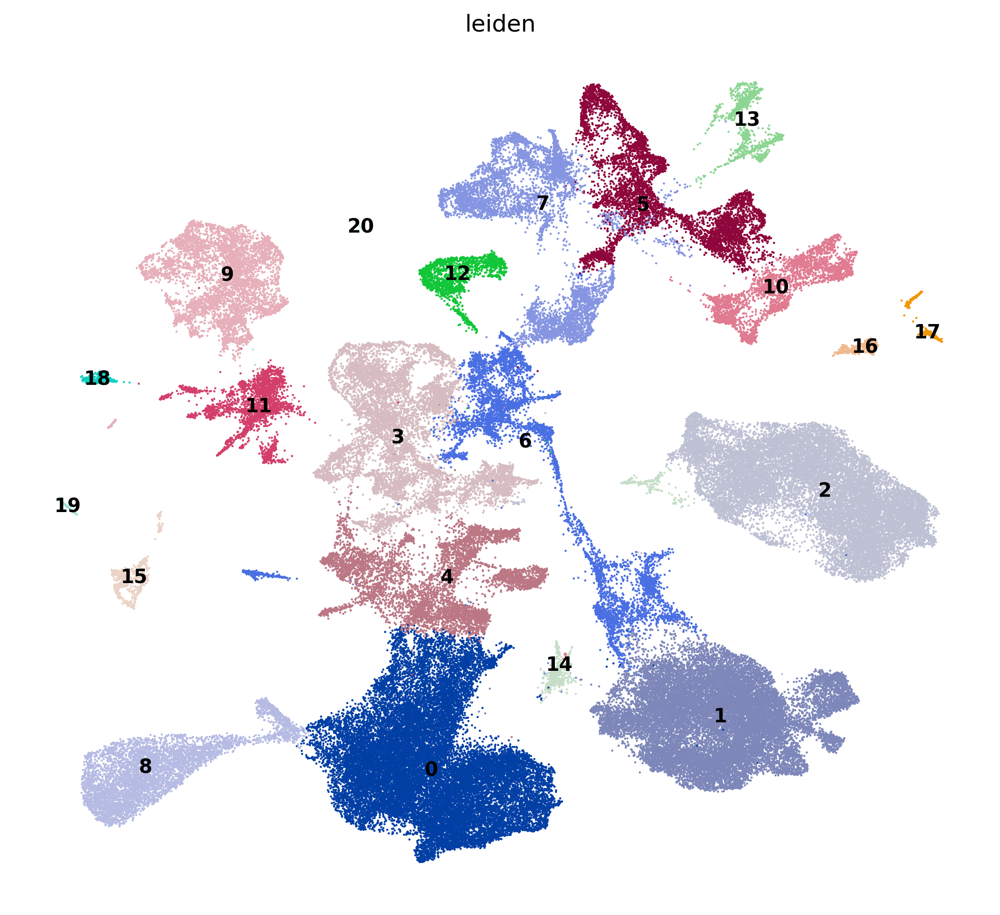

In [27]:
plt.figure(figsize=(9,8))
ax=plt.subplot(1,1,1)
sc.pl.umap(adata, color = ['leiden'], size = 5, frameon = False, legend_loc = "on data", ax=ax, show=False)
plt.savefig(directory + '/Figures/neuronsLeiden.png')

## go through each cluster and assign categories

In [229]:
cl = '4' #change this to iterate through clusters
adatasub = adata[adata.obs['leiden']==cl]
sc.pp.neighbors(adatasub, use_rep = 'X_scVI', method = 'umap', n_neighbors=15)
sc.tl.umap(adatasub, min_dist=0.3)

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Cat

Text(0, 0.5, 'Fraction of cell type')

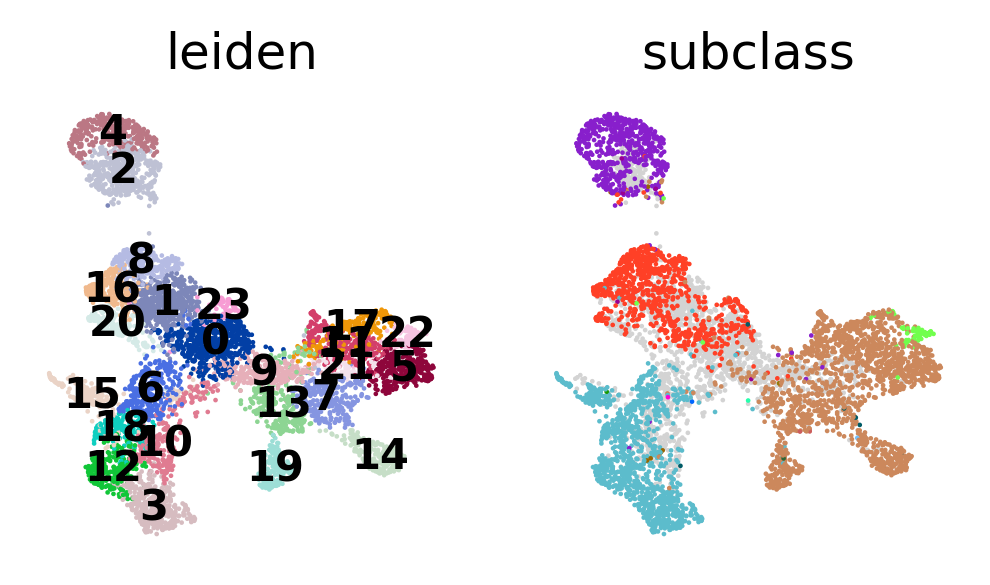

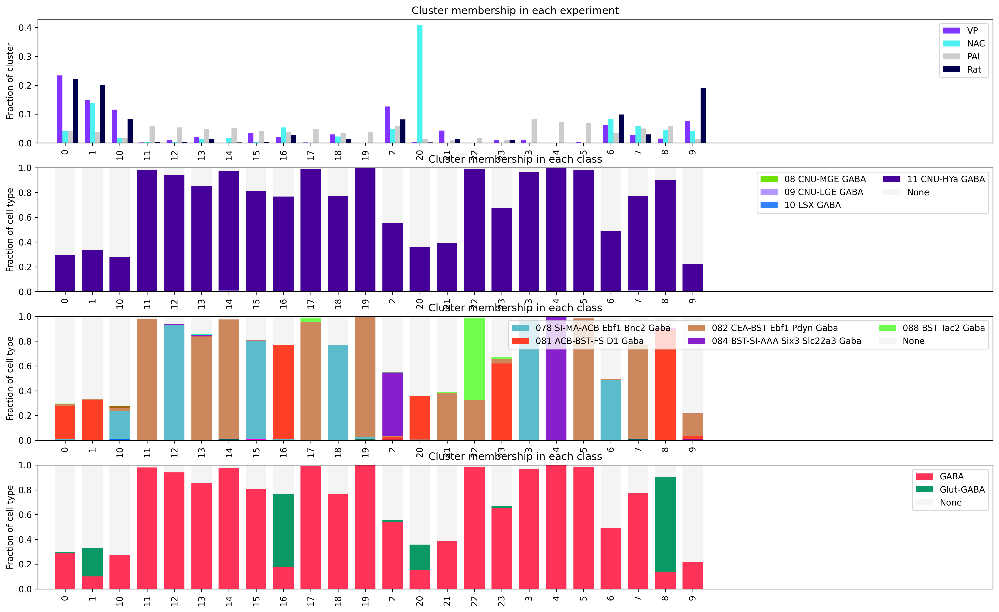

In [230]:
#0-9 done with resolution 1.5
#10- done with resolution 1
sc.tl.leiden(adatasub, resolution = 1.5)
plt.figure(figsize=(4,2))
ax=plt.subplot(1,2,1)
sc.pl.umap(adatasub, color = ['leiden'], frameon = False, size=5, legend_loc = "on data", ax=ax, show=False)

subclasses = np.unique(adatasub.obs['subclass'])
groups = subclasses[subclasses!='None']

ax=plt.subplot(1,2,2)
sc.pl.umap(adatasub, color = ['subclass'], groups = groups.tolist(), size = 5, frameon = False, palette=subclassp, legend_loc='None', ax=ax, show=False)
plt.savefig(directory + '/Figures/neuronIntEx1.png')

order = np.unique(adatasub.obs['leiden'])
xlims = (-1,len(order)+10)
groups = ['VP','NAC','PAL','Rat']
classes = np.unique(adatasub.obs['class'])
neurotransmitters = np.unique(adatasub.obs['neurotransmitter'])
subclasses = np.unique(adatasub.obs['subclass'])

typecount=np.zeros((len(groups),len(order)))
classcount=np.zeros((len(classes),len(order)))
ntcount=np.zeros((len(neurotransmitters),len(order)))
subclasscount=np.zeros((len(subclasses),len(order)))
for t in range(0,len(order)):
    for g in range(0,len(groups)):   
        typecount[g,t]=np.sum((adatasub.obs['leiden']==order[t]) & (adatasub.obs['Experiment']==groups[g]))    
    for g in range(0,len(classes)):    
        classcount[g,t]=np.sum((adatasub.obs['leiden']==order[t]) & (adatasub.obs['class']==classes[g]))# & (adata.obs['Experiment']=='VP'))  
    for g in range(0,len(subclasses)):   
        subclasscount[g,t]=np.sum((adatasub.obs['leiden']==order[t]) & (adatasub.obs['subclass']==subclasses[g]))# & (adata.obs['Experiment']=='VP'))      
    for g in range(0,len(neurotransmitters)):    
        ntcount[g,t]=np.sum((adatasub.obs['leiden']==order[t]) & (adatasub.obs['neurotransmitter']==neurotransmitters[g]))# & (adata.obs['Experiment']=='VP'))  


tcn = np.divide(typecount.transpose(),np.sum(typecount,axis=1)).transpose()
ccn = np.divide(classcount,np.sum(classcount,axis=0))
scn = np.divide(subclasscount,np.sum(subclasscount,axis=0))
ncn = np.divide(ntcount,np.sum(ntcount,axis=0))

plt.figure(figsize = (20,12))
ax = plt.subplot(4,1,1)
width = 0.19
bottom = np.zeros(len(order))

for g in range(0,len(groups)):
    p = ax.bar(np.arange(0,len(order))+(width*(g-1)), tcn[g,:], width, label=groups[g], bottom=bottom, color=excolors[groups[g]])
    #bottom += tcn[g,:]
#plt.plot((-1,40),(0.05,0.05),':','color','Black')
plt.title('Cluster membership in each experiment')
ax.legend(loc="upper right")
plt.xlim(xlims)
plt.xticks(range(0,len(order)),labels=order,rotation=90)
plt.ylabel('Fraction of cluster')
#plt.savefig(directory + '/Figures/neuronsExp.png')

ax = plt.subplot(4,1,2)
width = 0.75
bottom = np.zeros(len(order))

for g in range(0,len(classes)):
    p = ax.bar(order, ccn[g,:], width, label=classes[g], bottom=bottom, color=classp[classes[g]])
    bottom += ccn[g,:]
#plt.plot((-1,40),(0.05,0.05),':','color','Black')
plt.title('Cluster membership in each class')
ax.legend(loc="upper right", ncols=2)
plt.xlim(xlims)
plt.xticks(rotation=90)
plt.ylabel('Fraction of cell type')
#plt.savefig(directory + '/Figures/neuronsExp.png')

ax = plt.subplot(4,1,3)
width = 0.75
bottom = np.zeros(len(order))

lhs=[]
for g in range(0,len(subclasses)):
    p = ax.bar(order, scn[g,:], width, label=subclasses[g], bottom=bottom, color=subclassp[subclasses[g]])
    bottom += scn[g,:]
    if np.max(scn[g,:])>0.1:
        lhs.append(p)
        
#plt.plot((-1,40),(0.05,0.05),':','color','Black')
plt.title('Cluster membership in each class')
ax.legend(handles=lhs,loc="upper right", ncols=3)
plt.xlim(xlims)
plt.xticks(rotation=90)
plt.ylabel('Fraction of cell type')
#plt.savefig(directory + '/Figures/neuronsExp.png')

ax = plt.subplot(4,1,4)
width = 0.75
bottom = np.zeros(len(order))

for g in range(0,len(neurotransmitters)):
    p = ax.bar(order, ncn[g,:], width, label=neurotransmitters[g], bottom=bottom, color=neurotransmitterp[neurotransmitters[g]])
    bottom += ncn[g,:]
#plt.plot((-1,40),(0.05,0.05),':','color','Black')
plt.title('Cluster membership in each class')
ax.legend(loc="upper right")
plt.xlim(xlims)
plt.xticks(rotation=90)
plt.ylabel('Fraction of cell type')


/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Cat

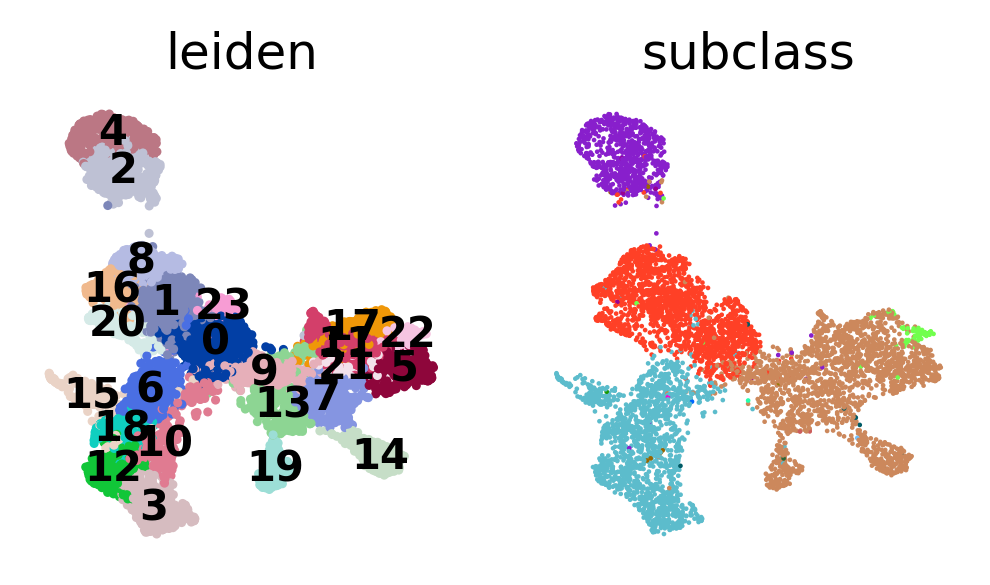

In [231]:
#assign labels according to majority PAL label in small cluster
for x in range(0,len(order)):
    selection=adatasub.obs['leiden']==order[x]
    allen=adatasub.obs['Experiment']=='PAL'
    (e,n)=np.unique(adatasub.obs['class'][selection&allen],return_counts=True)
    adatasub.obs['class'][selection&~allen]=e[np.argmax(n)]
    (e,n)=np.unique(adatasub.obs['subclass'][selection&allen],return_counts=True)
    adatasub.obs['subclass'][selection&~allen]=e[np.argmax(n)]
    (e,n)=np.unique(adatasub.obs['neurotransmitter'][selection&allen],return_counts=True)
    adatasub.obs['neurotransmitter'][selection&~allen]=e[np.argmax(n)]

plt.figure(figsize=(4,2))
ax=plt.subplot(1,2,1)
sc.pl.umap(adatasub, color = ['leiden'], frameon = False, legend_loc = "on data", ax=ax, show=False)

subclasses = np.unique(adatasub.obs['subclass'])
groups = subclasses[subclasses!='None']

ax=plt.subplot(1,2,2)
sc.pl.umap(adatasub, color = ['subclass'], groups = groups.tolist(), size = 5, frameon = False, palette=subclassp, legend_loc='None', ax=ax, show=False)
plt.savefig(directory + '/Figures/neuronIntEx2.png')

In [136]:
#update non-Allen cells
adata.obs['subclass'][(adata.obs['leiden']==cl)&(adata.obs['Experiment']!='PAL')]=adatasub.obs['subclass'][adatasub.obs['Experiment']!='PAL'].to_numpy()
adata.obs['class'][(adata.obs['leiden']==cl)&(adata.obs['Experiment']!='PAL')]=adatasub.obs['class'][adatasub.obs['Experiment']!='PAL'].to_numpy()
adata.obs['neurotransmitter'][(adata.obs['leiden']==cl)&(adata.obs['Experiment']!='PAL')]=adatasub.obs['neurotransmitter'][adatasub.obs['Experiment']!='PAL'].to_numpy()

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


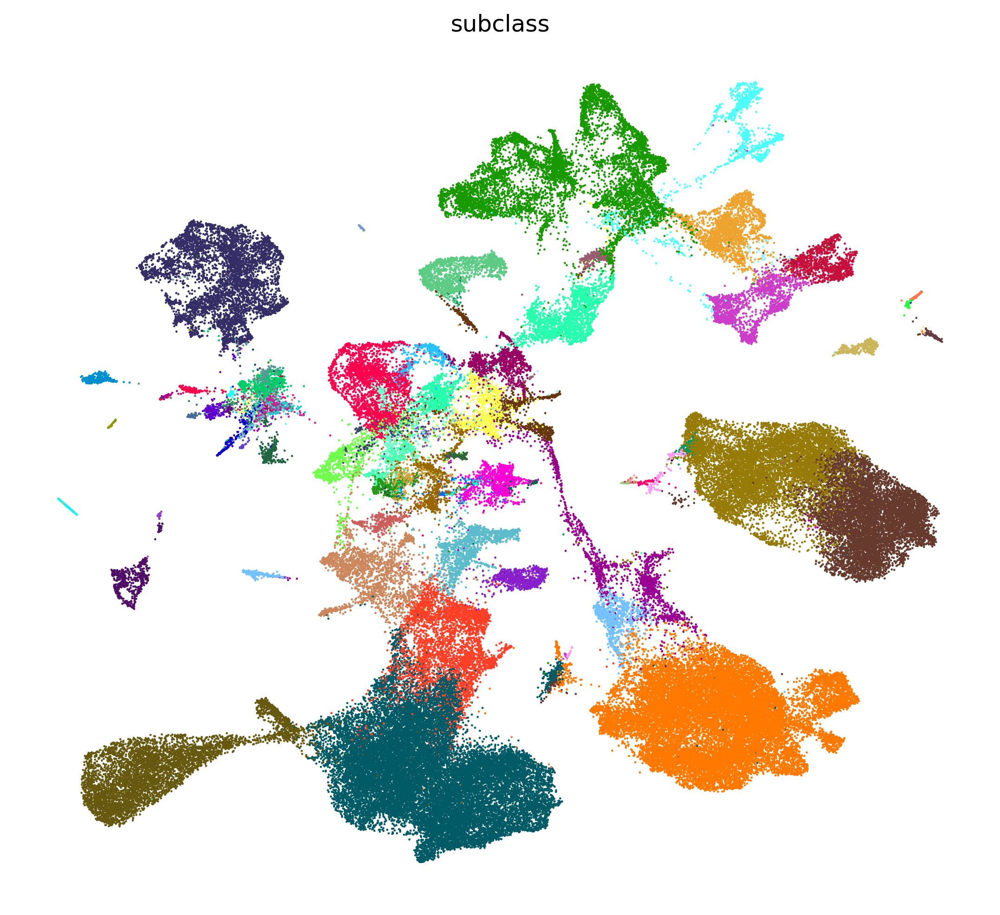

In [137]:
#visualize updated subclass labels
subclasses = np.unique(adata.obs['subclass'])
groups = subclasses[subclasses!='None']

plt.figure(figsize=(9,8))
ax=plt.subplot(1,1,1)
#sc.pl.umap(adata, color = ['Experiment'], size = 4, frameon = False, palette=excolors)
sc.pl.umap(adata, color = ['subclass'], groups = groups.tolist(), size = 5, frameon = False, palette=subclassp, legend_loc='None', ax=ax, show=False)
plt.savefig(directory + '/Figures/allSubclass.png')

In [139]:
adata.obs['Reg-Spec']='PAL-M'
adata.obs['Reg-Spec'][adata.obs['Experiment']=='NAC']='NAC-M'
adata.obs['Reg-Spec'][adata.obs['Experiment']=='VP']='VP-M'
adata.obs['Reg-Spec'][(adata.obs['Experiment']=='Rat') & (adata.obs['Sample'].isin(['N1','N2']))]='NAC-R'
adata.obs['Reg-Spec'][(adata.obs['Experiment']=='Rat') & (adata.obs['Sample'].isin(['V1','V2']))]='VP-R'

/var/folders/0d/m1rp2vsn40550y2btkrfwptr0000gn/T/ipykernel_70874/460313682.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['Reg-Spec'][adata.obs['Experiment']=='NAC']='NAC-M'
/var/folders/0d/m1rp2vsn40550y2btkrfwptr0000gn/T/ipykernel_70874/460313682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['Reg-Spec'][adata.obs['Experiment']=='VP']='VP-M'
/var/folders/0d/m1rp2vsn40550y2btkrfwptr0000gn/T/ipykernel_70874/460313682.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

In [142]:
adata.write_h5ad(directory + '/NAcVPInt.h5ad')

## more visualizations of integration

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


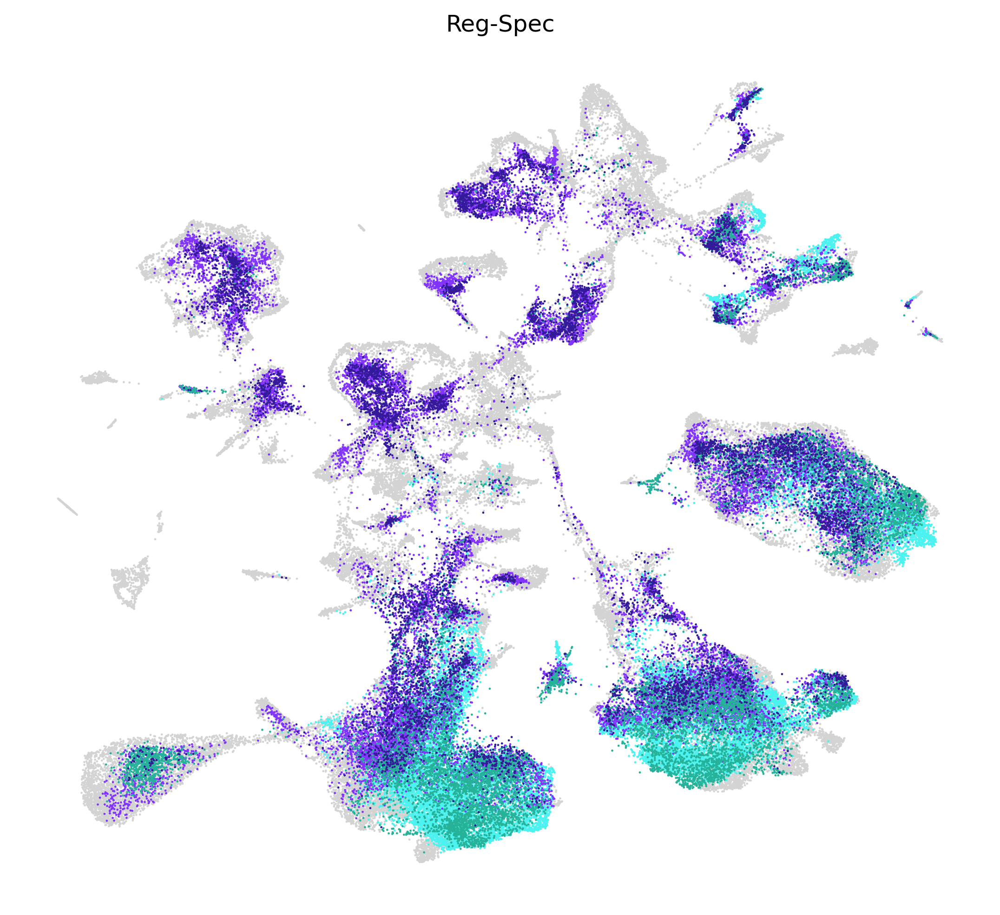

In [200]:
plt.figure(figsize=(9,8))
ax=plt.subplot(1,1,1)
rscolors = {'NAC-M':(0.3, 0.95, 0.94,1),'NAC-R':(0.15,0.7,0.6,1),'VP-M':(0.51, 0.2, 1, 1),'VP-R':(0.2, 0.1, 0.6, 1),'PAL-M':(0.8, 0.8, 0.8, 1)}
sc.pl.umap(adata, color = ['Reg-Spec'], groups = ['NAC-M','NAC-R','VP-M','VP-R'], size = 5, frameon = False, palette=rscolors, legend_loc='None', ax=ax, show=False)
plt.savefig(directory + '/Figures/neuronsReg.png')

In [4]:
#custom region order
maingroups = ['054','060','061','062','063',
          '055','056','058','064','081',
          '057','059','078','080','082',
          '083','084','085','086','088',
          '118','119',
          '010','039','079','101',
         ]

extra = np.unique(adata.obs['subclass'].astype('U3'))
extra = extra[~np.isin(extra,maingroups)]
groups = np.concatenate((maingroups,extra))
grouporder = np.argsort(np.argsort(groups))

#numerical order
grouporder = np.arange(len(np.unique(adata.obs['subclass'].astype('U3'))))
groupnames = np.unique(adata.obs['subclass'])

groupnames = groupnames[grouporder]


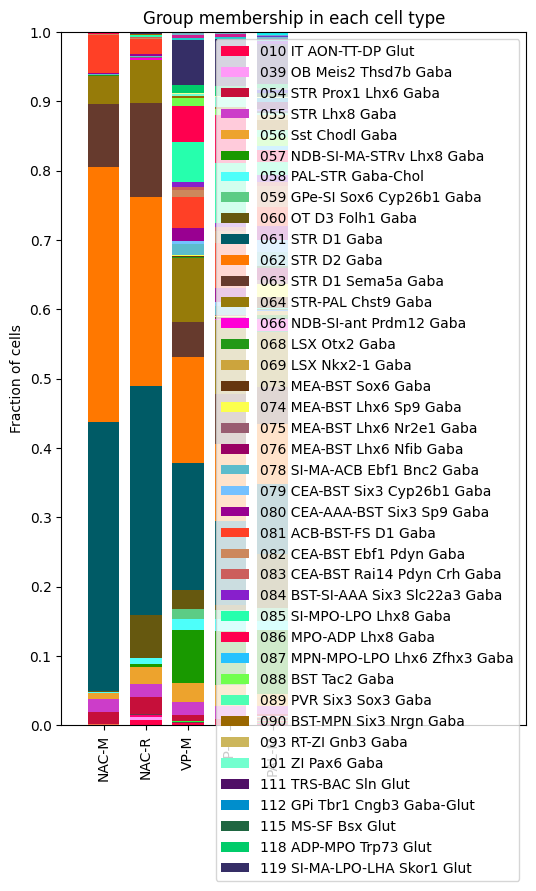

In [7]:
order = ['NAC-M','NAC-R','VP-M','VP-R','PAL-M']

typecount=np.zeros((len(groups),len(order)))
for g in range(0,len(groups)):   
    for t in range(0,len(order)):
        typecount[g,t]=np.sum((adata.obs['Reg-Spec']==order[t]) & (adata.obs['subclass']==groupnames[g]))                   

tcn = np.divide(typecount,np.sum(typecount,axis=0))

width = 0.75

fig, ax = plt.subplots(figsize = (6,9))
bottom = np.zeros(len(order))

lhs=[]
inc=np.full((len(groups),1),False,dtype='bool')
inccolors=[]
for g in range(0,len(groups)):
    p = ax.bar(order, tcn[g,:], width, label=groupnames[g], bottom=bottom, color=subclassp[groupnames[g]])
    bottom += tcn[g,:]
    if np.max(tcn[g,0:5])>=0.005:
        lhs.append(p)
        inc[g]=True
        inccolors.append(subclassp[groupnames[g]])
inc=inc.squeeze()

ax.legend(handles=lhs,loc="upper right", ncols=1)

plt.title('Group membership in each cell type')
plt.xlim((-1,10))
plt.xticks(rotation=90)
plt.yticks(np.arange(0,1.1,0.1))
plt.ylabel('Fraction of cells')
plt.savefig(directory + '/Figures/expSubclass.svg')

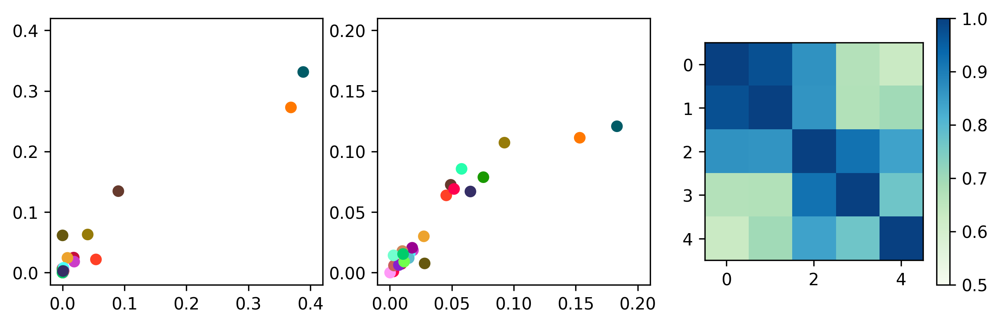

In [445]:
colororder=[]
for x in range(0,len(groupnames)):
    colororder.append(subclassp[groupnames[x]])

plt.figure(figsize=(10,2.9))
plt.subplot(1,3,1)
plt.scatter(tcn[inc,0],tcn[inc,1],c=inccolors)
plt.xlim((-0.02,0.42))
plt.ylim((-0.02,0.42))

plt.subplot(1,3,2)
plt.scatter(tcn[inc,2],tcn[inc,3],c=inccolors)
plt.xlim((-0.01,0.21))
plt.ylim((-0.01,0.21))

plt.subplot(1,3,3)
scCorr = np.corrcoef(tcn[inc,:],y=None,rowvar=False)
#scCorr = scipy.stats.spearmanr(tcn,axis=0)
plt.imshow(scCorr,vmin=0.5,vmax=1,cmap='GnBu')
plt.colorbar()
plt.savefig(directory + '/Figures/subclassComp.svg')

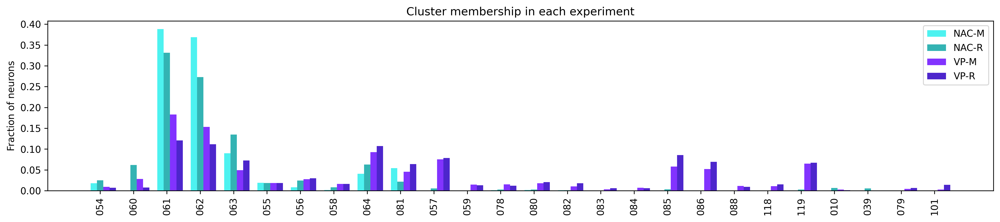

In [264]:
rscolors = {'NAC-M':(0.3, 0.95, 0.94,1),'NAC-R':(0.2,0.7,0.7,1),'VP-M':(0.51, 0.2, 1, 1),'VP-R':(0.3, 0.15, 0.8, 1)}
typecount=np.zeros((len(order),len(maingroups)))
totals=np.zeros(len(order))
for t in range(0,len(order)):
    totals[t]=np.sum(adata.obs['Reg-Spec']==order[t])
    for g in range(0,len(maingroups)):   
        typecount[t,g]=np.sum((adata.obs['Reg-Spec']==order[t]) & (adata.obs['subclass'].astype('U3')==maingroups[g]))    


tcn = np.divide(typecount.transpose(),totals).transpose()

plt.figure(figsize = (18,15))
ax = plt.subplot(4,1,1)
width = 0.19
bottom = np.zeros(len(maingroups))

for t in range(0,len(order)):
    p = ax.bar(np.arange(0,len(maingroups))+(width*(t-1)), tcn[t,:], width, label=order[t], bottom=bottom, color=rscolors[order[t]])
    #bottom += tcn[g,:]
#plt.plot((-1,40),(0.05,0.05),':','color','Black')
plt.title('Cluster membership in each experiment')
ax.legend(loc="upper right")
#plt.xlim(xlims)
plt.xticks(range(0,len(maingroups)),labels=maingroups,rotation=90)
plt.ylabel('Fraction of neurons')
plt.savefig(directory + '/Figures/neuronSubclassBars.svg')

# cell type markers on PAL dataset

In [2]:
adatapal = sc.read_h5ad('/Users/david/Dropbox/RNASeq/AllenPAL/neurons.h5ad')

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1899: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [3]:
#make gene names unique in Allen dataset
gs = adatapal.var.gene_symbol.tolist()
(palgenes,counts) = np.unique(gs, return_counts=True)
repeats = palgenes[counts==2]
for r in range(0,len(repeats)):
    gene = repeats[r]
    copy = np.nonzero(np.isin(gs,gene))[0][1]
    gs[copy] = gs[copy] + '-1'
adatapal.var.index=gs

In [4]:
#get metadata for allen dataset
allMeta = pd.read_csv('/Users/david/Dropbox/RNASeq/AllenPAL/Data/cell_metadata_with_cluster_annotation.csv')

/var/folders/0d/m1rp2vsn40550y2btkrfwptr0000gn/T/ipykernel_73920/166713103.py:2: DtypeWarning: Columns (16) have mixed types. Specify dtype option on import or set low_memory=False.
  allMeta = pd.read_csv('/Users/david/Dropbox/RNASeq/AllenPAL/Data/cell_metadata_with_cluster_annotation.csv')


In [5]:
#only keep data for PAL cells in meta file
palMeta = allMeta[allMeta.cell_label.isin(adatapal.obs.index)]
adatapal = adatapal[adatapal.obs.index.isin(palMeta.cell_label)]

In [6]:
#sort data the same way
palMeta = palMeta.sort_values(by=['cell_label'])
order = np.argsort(adatapal.obs.index)
adatapal=adatapal[order]

In [7]:
adatapal.obs['cluster']=palMeta['cluster'].to_numpy()
adatapal.obs['class']=palMeta['class'].to_numpy()
adatapal.obs['subclass']=palMeta['subclass'].to_numpy()
adatapal.obs['supertype']=palMeta['supertype'].to_numpy()
adatapal.obs['neurotransmitter']=palMeta['neurotransmitter'].to_numpy()
adatapal.obs['Experiment']='PAL'
adatapal.obs['Species']='Mouse'

/var/folders/0d/m1rp2vsn40550y2btkrfwptr0000gn/T/ipykernel_73920/1596155659.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adatapal.obs['cluster']=palMeta['cluster'].to_numpy()


In [8]:
del(allMeta,palMeta)

In [9]:
adatapal.layers['counts_norm']=adatapal.layers['counts'].copy()
sc.pp.normalize_total(adatapal, target_sum = 1e4, layer='counts_norm')
#sc.pp.log1p(adata, layer='counts_norm')

In [10]:
#assign cells to brain region according to Allen subclass
order = [ 
         '055 STR Lhx8 Gaba','056 Sst Chodl Gaba','057 NDB-SI-MA-STRv Lhx8 Gaba','058 PAL-STR Gaba-Chol','059 GPe-SI Sox6 Cyp26b1 Gaba',
         '064 STR-PAL Chst9 Gaba','078 SI-MA-ACB Ebf1 Bnc2 Gaba','080 CEA-AAA-BST Six3 Sp9 Gaba','081 ACB-BST-FS D1 Gaba',
         '082 CEA-BST Ebf1 Pdyn Gaba','084 BST-SI-AAA Six3 Slc22a3 Gaba',
         '085 SI-MPO-LPO Lhx8 Gaba','086 MPO-ADP Lhx8 Gaba','088 BST Tac2 Gaba',
         '118 ADP-MPO Trp73 Glut','119 SI-MA-LPO-LHA Skor1 Glut',
         '054 STR Prox1 Lhx6 Gaba','060 OT D3 Folh1 Gaba','061 STR D1 Gaba','062 STR D2 Gaba','063 STR D1 Sema5a Gaba',
        ]
#order.reverse()

In [13]:
#markers of interest
strv = ['Rarb','Pde7b','Pdzd2']
vp = ['Dscam','Scn9a','Elavl4']
nt = ['Slc32a1','Slc17a6','Slc17a7','Slc17a8','Slc5a7']
msn = ['Drd1','Drd2','Drd3','Ppp1r1b']
opioid = ['Penk','Pdyn','Pomc','Oprm1','Oprk1','Oprd1']             
tf = ['Nfib','Tcf4','Etv1','Nkx2-1','Lhx6','Lhx8','Sox6','Gbx1','Npas1','Casz1','Prox1','Meis2',
      'Foxp2','Ebf1','Six3','Zfhx3','Zfhx4','Tcf7l2']#'Zbtb16', 'Pbx3'
marker = ['Moxd1','Sst','Npy','Tacr1','Gpc5','Elfn1','Cyp26b1','Penk','Chst9','Tshz1','Bnc2','Nts','Pdyn','Fign',
          'Trdn','Sema5a','Prlr','Tmem163','Calb2','Calb1','Drd3','Drd1','Drd2','Ppp1r1b','Pvalb']#,'Il1rapl2','Chrm3','Rai14']
hormones = ['Esr1','Esr2','Ar','Pgr','Crhr1','Crh','Crhr2','Nr3c1','Nr3c2','Ghrl','Mc4r','Mc5r','Lepr',
            'Sst','Sstr1','Sstr2','Sstr3','Sstr4',
            'Npy','Npy1r','Npy5r','Nts','Ntsr1','Hcrt','Hcrtr1','Hcrtr2','Prlr']
gaba = ['Slc32a1','Gad1','Gad2','Gabra1','Gabra2','Gabra3','Gabra4','Gabra5','Gabrb1','Gabrb2','Gabrb3',
        'Gabrg1','Gabrg2','Gabrg3','Gabrd','Gabrq','Gabrr1','Gabrr2','Gabrr3','Gabbr1','Gabbr2']
glutamate = ['Slc17a6','Slc17a7','Slc17a8','Gria1','Gria2','Gria4',
             'Grid1','Grid2','Grik1','Grik2','Grik3','Grik4','Grik5',
             'Grin1','Grin2a','Grin2b','Grin2c','Grin2d','Grin3a','Grin3b',
            'Grm1','Grm2','Grm3','Grm4','Grm5','Grm7','Grm8']
dopamine = ['Th','Drd1','Drd2','Drd3'] #Slc18a1
serotonin = ['Slc6a4','Htr1a','Htr1b','Htr1d','Htr1f','Htr2a','Htr2b','Htr2c','Htr3a',
             'Htr4','Htr5a','Htr5b','Htr6','Htr7']
ach = ['Slc5a7','Prima1','Chrna1','Chrna2','Chrna3','Chrna4','Chrna5','Chrna7','Chrna10',
       'Chrnb1','Chrnb2','Chrnb3','Chrnb4',
      'Chrm1','Chrm2','Chrm3','Chrm4','Chrm5']
glycine = ['Slc6a9','Glra1','Glra2','Glra3','Glra4','Glrb']
norep = ['Slc6a2','Adra1b','Adra1d','Adra2a','Adra2b','Adra2c','Adrb1']
other = ['Cnr1','Cnr2','Glp1r']

/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/Users/david/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to m

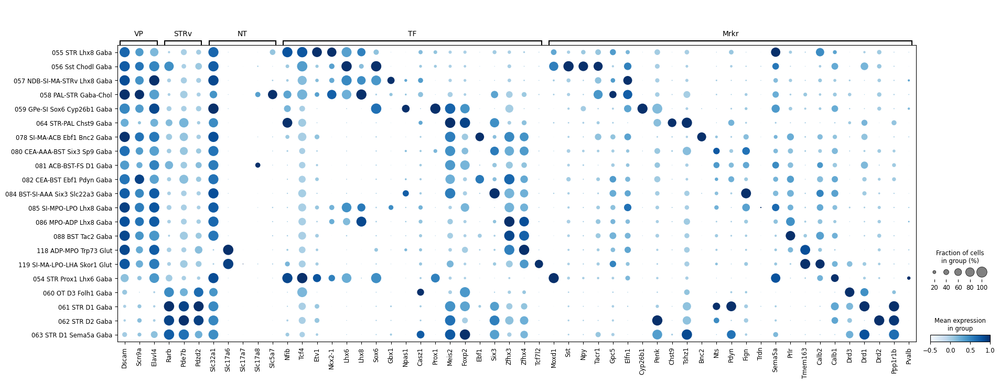

In [14]:
markers = {
           'VP': vp,
            'STRv': strv,
           'NT': nt, 
           'TF':tf,
           'Mrkr':marker 
          }
dp = sc.pl.dotplot(adatapal[adatapal.obs['subclass'].isin(order)], markers, layer='counts_norm',groupby='subclass', categories_order=order,
                   standard_scale='var', vmin=-0.5, vmax=1,dendrogram=False, return_fig=True) 
dp.style(dot_edge_color=None, dot_edge_lw=0.5, cmap='Blues', x_padding=0.5, y_padding=0.5)
#dp.add_totals(sort=None, color='black').style(dot_edge_color=None, dot_edge_lw=0.5, cmap='Blues', x_padding=0.5, y_padding=0.5)
dp.savefig(directory + '/Figures/VPmarkersPAL.svg')